* 存在严重的过拟合问题，必须使用dropout
* validation set和 test set 不是一样的数据分布（添加数据？）


* error analysis，看哪里图片预测的不准确

In [1]:
import numpy as np
from keras.models import Model
from keras.models import load_model
import h5py
import matplotlib.pyplot as plt 
%matplotlib inline


model = load_model('./models/drop19_0.618.h5')

Using TensorFlow backend.


## Calucate test_mse

In [2]:
h5f2 = h5py.File('./data/test_no_shuffle.h5','r')
%time X_test = h5f2['image'][:]
%time y_test = h5f2['steering'][:]
h5f2.close()

# y_val = y_val[:,np.r_[134:176, 92:118, 16:60, 76:92, 0:16, 118:134, 60:76]]
print("X_test shape: ",X_test.shape)
print("y_test shape: ",y_test.shape)

CPU times: user 4.95 ms, sys: 939 ms, total: 944 ms
Wall time: 1.36 s
CPU times: user 844 µs, sys: 91 µs, total: 935 µs
Wall time: 951 µs
X_test shape:  (2700, 66, 200, 3)
y_test shape:  (2700, 1)


In [3]:
pred_y = model.predict(X_test)

In [4]:
test_mse = np.squeeze(np.square(pred_y-y_test))

In [5]:
model.evaluate(X_test,y_test)

2688/2700 [============================>.] - ETA: 0s

2.3276471164491443

### 输出csv:  
idx;test_mse;y_test;pred_y   

In [7]:
# 输出csv
idx = np.arange(1,2701)
output = np.stack((idx,np.squeeze(test_mse),np.squeeze(y_test),np.squeeze(pred_y)), axis=1)
output.shape

(2700, 4)

In [8]:
np.savetxt("./test_mse.csv", output, delimiter=",")

## Error Detail

In [9]:
error_idxs = np.squeeze(np.where(test_mse > 9))
print(len(error_idxs))
error_idxs


81


array([ 632,  633,  846,  847,  848,  849,  850,  851,  852,  853,  854,
        855,  856,  857,  858,  859,  860,  861,  862,  863,  864,  865,
        866,  867,  868,  869,  870,  871,  872,  873,  874,  875,  876,
        877,  878,  879, 1304, 1305, 1306, 1307, 1308, 1309, 1310, 1311,
       1312, 1739, 1740, 1742, 1751, 1752, 1753, 1754, 1755, 1762, 1763,
       1764, 1765, 1766, 1767, 1768, 1769, 1770, 1771, 1772, 1780, 1781,
       1791, 1792, 1793, 1794, 1795, 1796, 1797, 1804, 1805, 2016, 2635,
       2636, 2637, 2638, 2639])

使用dropout test_mse = 2.327647100554572   
如果解决mse>9的81个图片，那么剩下的test_mse = 1.9729817604554345  

In [10]:
(pred_y.shape[0] *2.3276471164491443 - np.mean(test_mse[error_idxs]) * len(error_idxs))/ (pred_y.shape[0]-81)

1.9729817604554345

这些图片 集中在  632- 633；846 -879；1304-1312；1739-1742；1751-1755；1762-1772；1780-1781；1791-1797；1804-1805；2016；2635-2639。  


* 在12-13s的地方有天桥，(360-380f)在过桥前，桥的阴影使得误差增大。  
* 633-634f, 21s, 没什么异常  624-658f
* 845-887f ,28s-30s, 没什么障碍物，光线正常，只是一直在左转，角度大（4.5-6.5度）,一个大转弯->训练数据不够。
* 1293-1323，43.1-44.1s, 以40px为边界，马路延伸不够

* 1729-1813f, 57.6s-60.4s; s型转弯 前半段，没有考虑速度，只处理单个图片
* 2628-2645f,87.6-88.2

### plot test_mse 

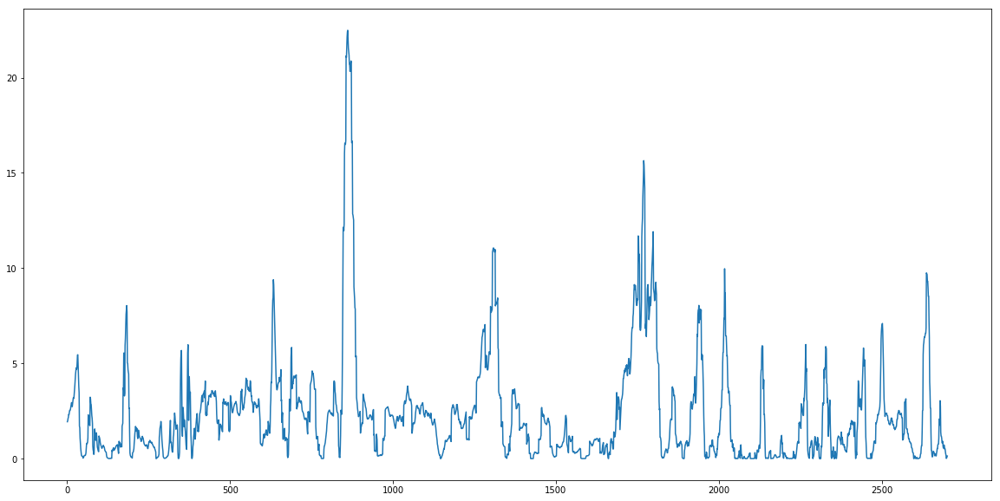

In [71]:
# Create some data
plt.figure(figsize=(20, 10))

x = np.linspace(1, 2701, 2700)
# y = np.cumsum(rng.randn(500, 6), 0)

# Plot the data with Matplotlib defaults
plt.plot(x, test_mse)
# plt.legend('ABCDEF', ncol=2, loc='upper left');


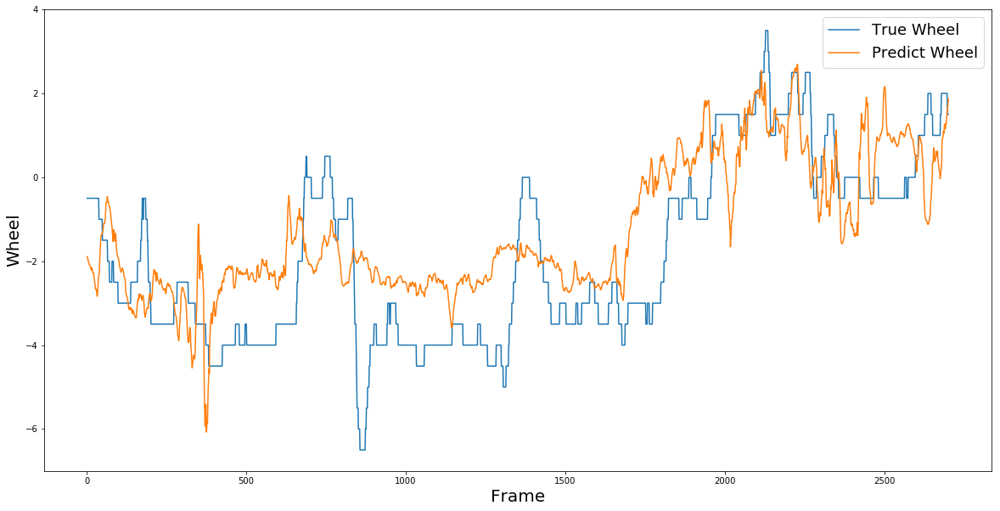

In [15]:
# Create some data
plt.figure(figsize=(20, 10))

x = np.linspace(1, 2701, 2700)
# y = np.cumsum(rng.randn(500, 6), 0)

# Plot the data with Matplotlib defaults
plt.plot(x, output[:,2:])
plt.legend(('True Wheel','Predict Wheel'), loc='upper right',fontsize=18);
plt.ylabel('Wheel', fontsize=20)
plt.xlabel('Frame',fontsize=20)

### 主要的error

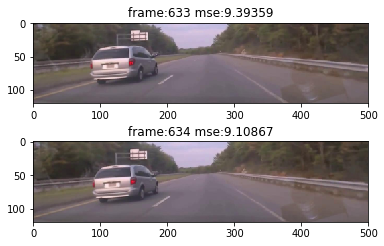

In [85]:
from scipy.misc import imread

plt.figure(figsize=(20, 10))
fig, ax = plt.subplots(2, 1)

for i, idx in enumerate(error_idxs[:2]):
    img = imread('./images_10epoch/epoch10_{}_front.jpg'.format(idx))
    shape = img.shape
    img_crop = img[int(shape[0]/3):shape[0]-150, 0:shape[1]]
    
    # Resize the image
    img_resize = cv2.resize(img_crop, (500, 120), interpolation=cv2.INTER_AREA)
    error = test_mse[idx]
    ax[i].set_title("frame:"+str(idx+1) +" mse:" +str(error))
    ax[i].imshow(img_resize)
                 
#     plt.subplot(5, 3, i+1)
#     plt.imshow(result)
                 
                 


#### 过天桥前，360-380f,mse:2-5.9

[ 2.29460335  3.74142218  5.53309393  5.97939253  4.73244095  2.00647116
  3.23955774  4.30550528  3.64277697  3.18418026  3.48972511  2.18026924]


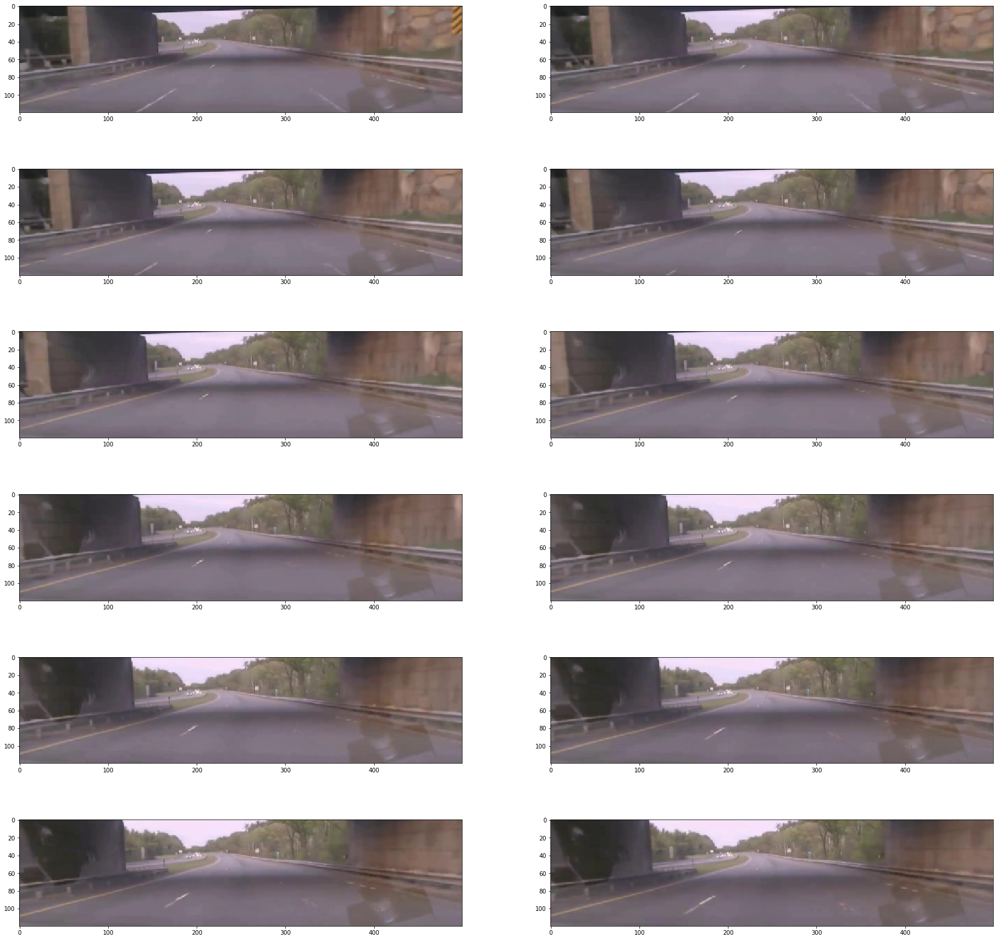

In [107]:
img_idx = np.arange(367,379)

plt.figure(figsize=(30, 30))
# fig, ax = plt.subplots(5, 1)

for i, idx in enumerate(img_idx):
    img = imread('./images_10epoch/epoch10_{}_front.jpg'.format(idx))
    shape = img.shape
    img_crop = img[int(shape[0]/3):shape[0]-150, 0:shape[1]]
    
    # Resize the image
    img_resize = cv2.resize(img_crop, (500, 120), interpolation=cv2.INTER_AREA)
    error = test_mse[idx]
#     ax[i].set_title("frame:"+str(idx+1) +" mse:" +str(error))
#     ax[i].imshow(img_resize)
                 
    plt.subplot(6, 2, i+1)
    plt.imshow(img_resize)
    
print(test_mse[img_idx])
                 
                 
                 

#### 左边出现一辆车，629-640f，mse：5.6-9.39

[ 6.12897921  7.616189    8.32167053  8.44012356  9.39358997  9.10867405
  8.35799789  7.46261597  6.66305923  6.32576275  5.64700031]


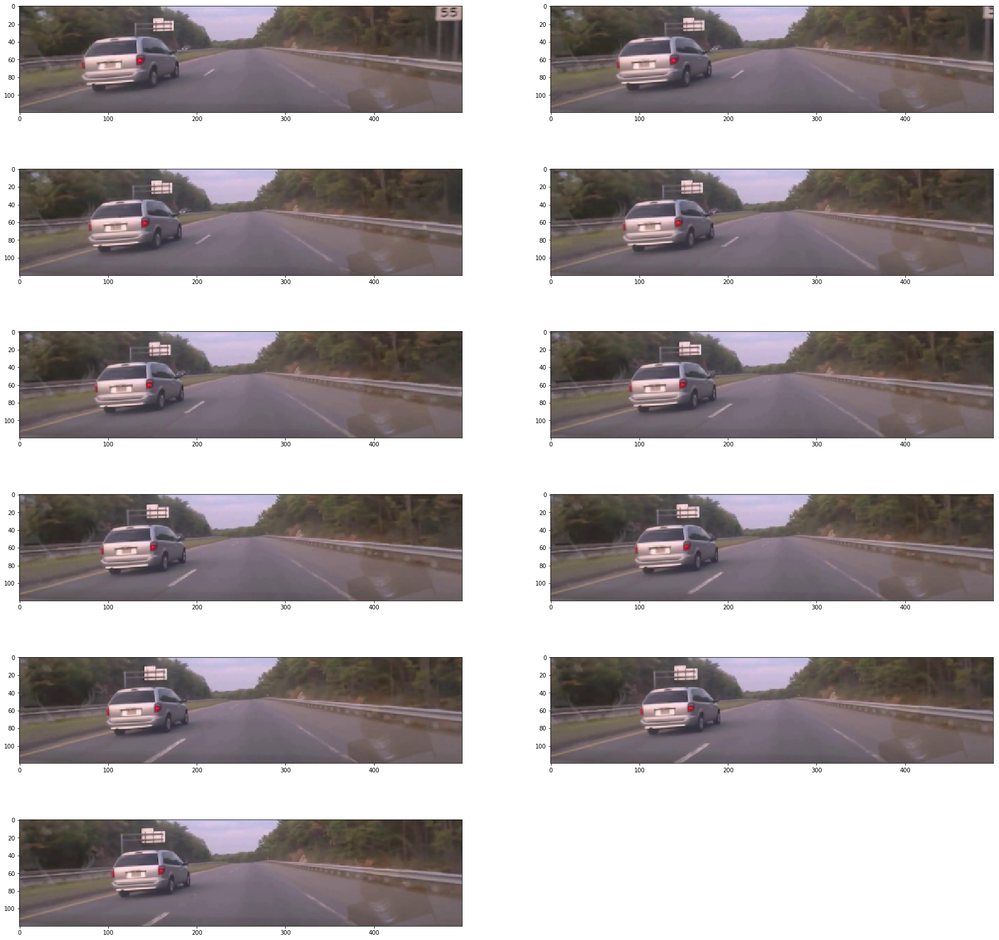

In [108]:
img_idx = np.arange(629,640)-1

plt.figure(figsize=(30, 30))
# fig, ax = plt.subplots(5, 1)

for i, idx in enumerate(img_idx):
    img = imread('./images_10epoch/epoch10_{}_front.jpg'.format(idx))
    shape = img.shape
    img_crop = img[int(shape[0]/3):shape[0]-150, 0:shape[1]]
    
    # Resize the image
    img_resize = cv2.resize(img_crop, (500, 120), interpolation=cv2.INTER_AREA)
    error = test_mse[idx]
#     ax[i].set_title("frame:"+str(idx+1) +" mse:" +str(error))
#     ax[i].imshow(img_resize)
                 
    plt.subplot(6, 2, i+1)
    plt.imshow(img_resize)
    
print(test_mse[img_idx])

最大error：  
#### 大转弯  
845-887f, mse: 5.3-22.5

[  6.01511717   8.77166271  12.14628124  12.13864994  11.96322346
  12.32003593  16.0236187   16.55505562  16.56394958  16.49691772
  16.68862724  21.13799667  21.06347847  21.62242126  22.12606812
  22.40850449  22.4886055   22.04191208  21.54403496  21.38618851
  21.18697929  20.69910049  20.65911102  20.32634926  20.54399872
  20.78774261  20.87719727  20.82359505  16.58940697  16.60975075
  16.66581726  12.85107613  12.78505993  12.67151356  12.52476597
   9.02558136   8.69922543   8.4058876    7.92581987   7.85887384
   5.33678389   5.36962461]


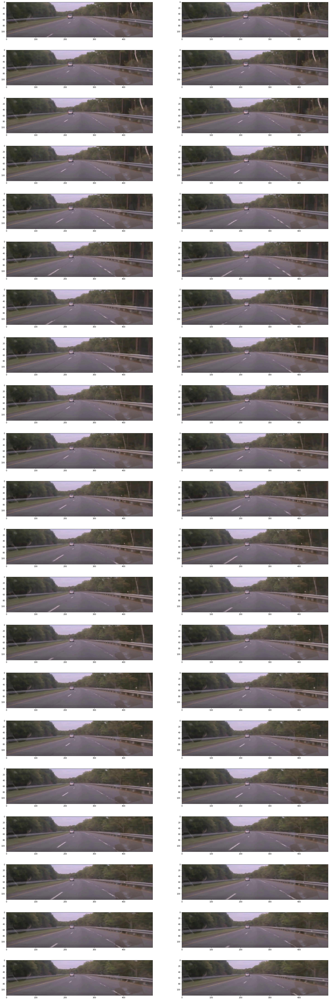

In [113]:
img_idx = np.arange(845,887)-1

plt.figure(figsize=(30, 100))
# fig, ax = plt.subplots(5, 1)

for i, idx in enumerate(img_idx):
    img = imread('./images_10epoch/epoch10_{}_front.jpg'.format(idx))
    shape = img.shape
    img_crop = img[int(shape[0]/3):shape[0]-150, 0:shape[1]]
    
    # Resize the image
    img_resize = cv2.resize(img_crop, (500, 120), interpolation=cv2.INTER_AREA)
    error = test_mse[idx]
#     ax[i].set_title("frame:"+str(idx+1) +" mse:" +str(error))
#     ax[i].imshow(img_resize)
                 
    plt.subplot(22, 2, i+1)
    plt.imshow(img_resize)
    
print(test_mse[img_idx])

#### 以40px为边界，马路延伸不够
1293,1323f; mse:5-11

[  5.12318516   5.46660328   5.61184454   5.61046886   5.51102066
   5.4725461    7.98750067   7.80385351   7.67371893   7.72619295
   7.78626442   7.82721281  10.87344742  10.91906834  11.03773403
  11.06201458  11.01411057  10.98438072  10.86155224  10.83197021
  10.97850323   8.01606274   8.11544609   8.1816721    8.11356544
   8.21100235   8.23860455   8.34888744   8.43335056   5.82468462]


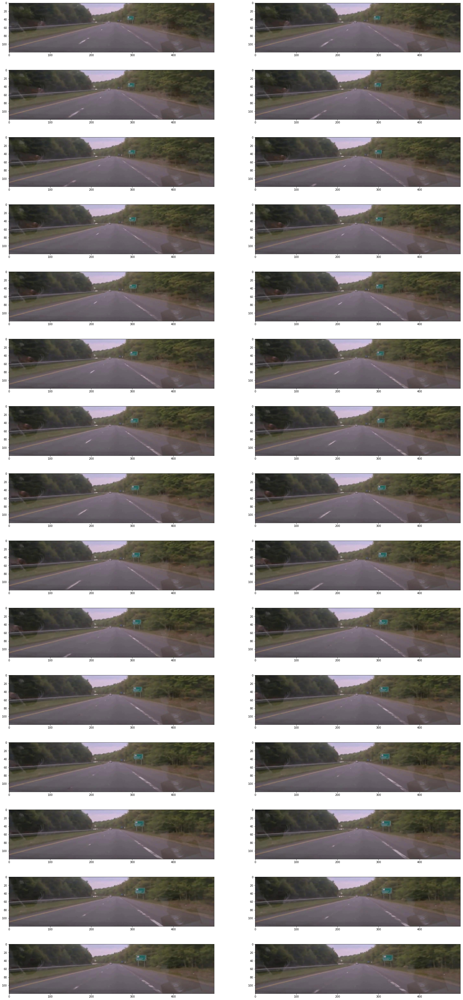

In [114]:
img_idx = np.arange(1293,1323)-1

plt.figure(figsize=(30, 100))
# fig, ax = plt.subplots(5, 1)

for i, idx in enumerate(img_idx):
    img = imread('./images_10epoch/epoch10_{}_front.jpg'.format(idx))
    shape = img.shape
    img_crop = img[int(shape[0]/3):shape[0]-150, 0:shape[1]]
    
    # Resize the image
    img_resize = cv2.resize(img_crop, (500, 120), interpolation=cv2.INTER_AREA)
    error = test_mse[idx]
#     ax[i].set_title("frame:"+str(idx+1) +" mse:" +str(error))
#     ax[i].imshow(img_resize)
                 
    plt.subplot(22, 2, i+1)
    plt.imshow(img_resize)
    
print(test_mse[img_idx])

####  s型转弯 前半段，没有考虑速度，之前转角，只处理单个图片
1729-1813f, 57.6s-60.4s;  
mse: 5-15.6

1739-1742；1751-1755；1762-1772；1780-1781；1791-1797；1804-1805 超过9

[ 0.45838282  0.3734653   0.21974735  0.26686165  1.44454753  1.55802691
  1.32863665  1.14045382  0.95495045  1.03396404]


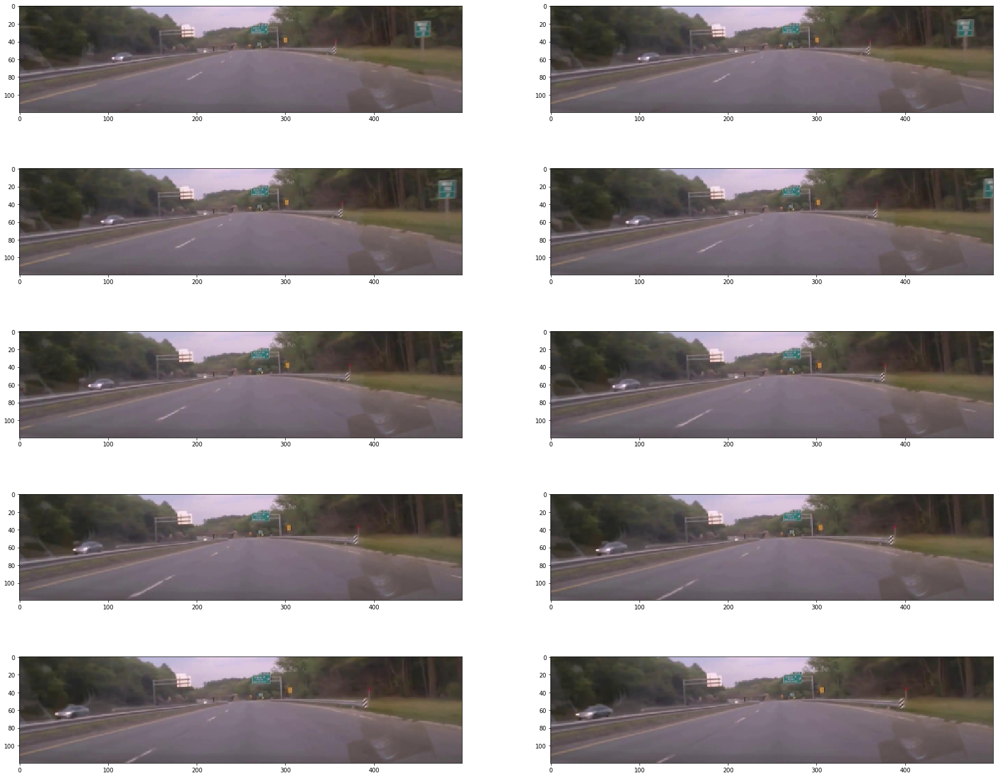

In [122]:
# img_idx = np.arange(1739,1742)-1

img_idx = np.arange(80,90)-1

plt.figure(figsize=(30, 30))
# fig, ax = plt.subplots(5, 1)

for i, idx in enumerate(img_idx):
    img = imread('./images_10epoch/epoch10_{}_front.jpg'.format(idx))
    shape = img.shape
    img_crop = img[int(shape[0]/3):shape[0]-150, 0:shape[1]]
    
    # Resize the image
    img_resize = cv2.resize(img_crop, (500, 120), interpolation=cv2.INTER_AREA)
    error = test_mse[idx]
#     ax[i].set_title("frame:"+str(idx+1) +" mse:" +str(error))
#     ax[i].imshow(img_resize)
                 
    plt.subplot(6, 2, i+1)
    plt.imshow(img_resize)
    
print(test_mse[img_idx])

#### 2628-2645f,87.6-88.2s，右转预测左转，原因未详

[ 1.45247221  2.51355124  2.5349431   5.44713116  5.96518612  6.08035898
  6.29595232  6.39534187]


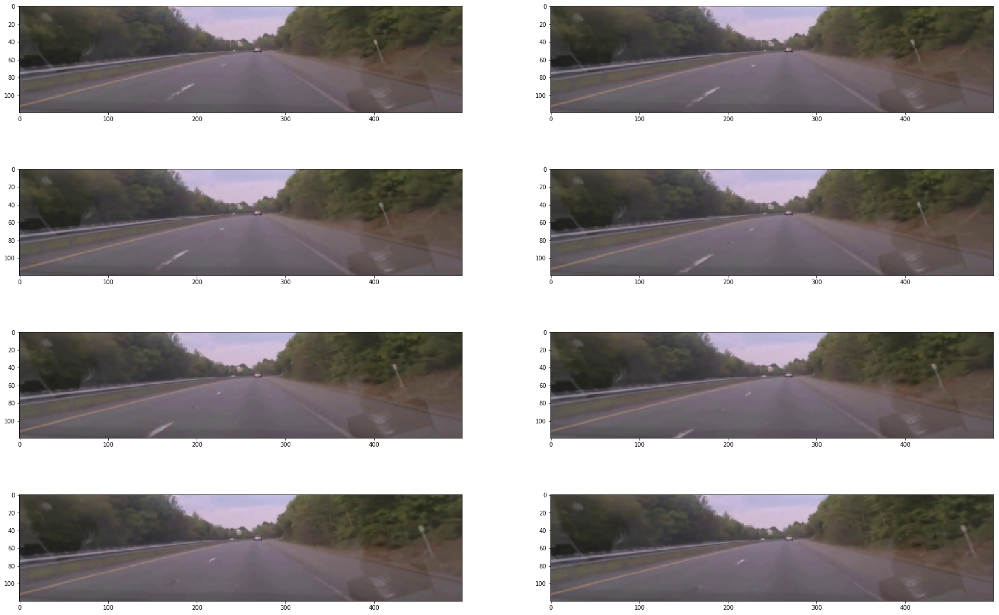

In [128]:
img_idx = np.arange(2623,2631)-1

plt.figure(figsize=(30, 30))
# fig, ax = plt.subplots(5, 1)

for i, idx in enumerate(img_idx):
    img = imread('./images_10epoch/epoch10_{}_front.jpg'.format(idx))
    shape = img.shape
    img_crop = img[int(shape[0]/3):shape[0]-150, 0:shape[1]]
    
    # Resize the image
    img_resize = cv2.resize(img_crop, (500, 120), interpolation=cv2.INTER_AREA)
    error = test_mse[idx]
#     ax[i].set_title("frame:"+str(idx+1) +" mse:" +str(error))
#     ax[i].imshow(img_resize)
                 
    plt.subplot(6, 2, i+1)
    plt.imshow(img_resize)
    
print(test_mse[img_idx])

## steering plot

In [5]:
import matplotlib.pyplot as plt 
%matplotlib inline
import h5py
h5f = h5py.File('./data/train.h5','r')

%time y_train = h5f['steering'][:]
h5f.close()

print("y_train shape: ",y_train.shape)

CPU times: user 687 µs, sys: 312 µs, total: 999 µs
Wall time: 1.25 ms
y_train shape:  (24300, 1)


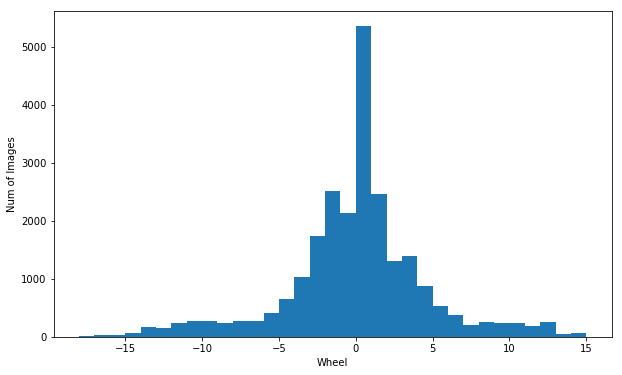

In [21]:

plt.figure(figsize=(10, 6))

binwidth=1
start_p = int(np.ceil(min(y_train)))
end_p = int(np.floor(max(y_train)) + binwidth)
plt.hist(y_train,bins=range(start_p, end_p, binwidth))

# override = {
#    'fontsize'            : 'small',
#    'verticalalignment'   : 'center',
#    'horizontalalignment' : 'right',
#    'rotation'='vertical' : }
plt.xlabel('Wheel',)
plt.ylabel('Num of Images')


In [8]:
num_0 = len(np.where(y_train==0)[0])
num_0_1 = len(np.where((y_train>0)&(y_train<=1))[0])
num_n1_0 = len(np.where((y_train>=-1)&(y_train<0))[0])
num_n1_1 = len(np.where((y_train>=-1)&(y_train<=1))[0])
num_n3_3 = len(np.where((np.abs(y_train)<=3)&(np.abs(y_train)>1))[0])

print("steering = 0: ",num_0)
print("steering >0 and <=1: ",num_0_1)
print("steering >=-1 and <0: ",num_n1_0)
print("steering >=-1 and <=1: ",num_n1_1)
print("steering >=-3 and <=3: ",num_n3_3)

steering = 0:  2001
steering >0 and <=1:  4860
steering >=-1 and <0:  2134
steering >=-1 and <=1:  8995
steering >=-3 and <=3:  7229


In [17]:
num_0 = len(np.where(y_train==0)[0])
num_0_1 = len(np.where((y_train>0)&(y_train<=1))[0])
num_1_3 = len(np.where((y_train>1)&(y_train<=3))[0])
num_3_ = len(np.where(y_train>3)[0])
num_n1_0 = len(np.where((y_train>=-1)&(y_train<0))[0])
num_n3_n1 = len(np.where((y_train>=-3)&(y_train<-1))[0])
num_n3_ = len(np.where(y_train<-3)[0])

print(num_0/24300*100)
print(num_0_1/24300*100)
print(num_1_3/24300*100)
print(num_3_/24300*100)
print(num_n1_0/24300*100)
print(num_n3_n1/24300*100)
print(num_n3_/24300*100)

8.234567901234568
20.0
12.205761316872428
16.419753086419753
8.781893004115226
17.54320987654321
16.814814814814817


steering 在-1和1之间有8995，占8996/24300=.37。  
车辆转弯数据不够。  

In [169]:
y_train.shape

(24300, 1)

In [170]:
unique_elements, counts_elements = np.unique(y_train, return_counts=True)

In [184]:
unique_elements[36]==0

True

In [175]:
for ele, cnt in zip(unique_elements,counts_elements):
    print(ele,'\t',cnt)

-18.0 	 3
-17.5 	 7
-17.0 	 11
-16.5 	 12
-16.0 	 13
-15.5 	 14
-15.0 	 35
-14.5 	 26
-14.0 	 57
-13.5 	 104
-13.0 	 85
-12.5 	 66
-12.0 	 91
-11.5 	 140
-11.0 	 154
-10.5 	 112
-10.0 	 113
-9.5 	 165
-9.0 	 126
-8.5 	 106
-8.0 	 152
-7.5 	 124
-7.0 	 145
-6.5 	 130
-6.0 	 225
-5.5 	 187
-5.0 	 252
-4.5 	 403
-4.0 	 334
-3.5 	 694
-3.0 	 804
-2.5 	 942
-2.0 	 1270
-1.5 	 1247
-1.0 	 886
-0.5 	 1248
0.0 	 2001
0.5 	 3363
1.0 	 1497
1.5 	 973
2.0 	 764
2.5 	 545
3.0 	 684
3.5 	 715
4.0 	 383
4.5 	 495
5.0 	 216
5.5 	 311
6.0 	 221
6.5 	 154
7.0 	 102
7.5 	 108
8.0 	 172
8.5 	 85
9.0 	 96
9.5 	 134
10.0 	 108
10.5 	 129
11.0 	 70
11.5 	 108
12.0 	 170
12.5 	 93
13.0 	 34
13.5 	 20
14.0 	 31
14.5 	 32
15.0 	 3


In [177]:
for ele in counts_elements[::-1]:
    print(ele)

3
32
31
20
34
93
170
108
70
129
108
134
96
85
172
108
102
154
221
311
216
495
383
715
684
545
764
973
1497
3363
2001
1248
886
1247
1270
942
804
694
334
403
252
187
225
130
145
124
152
106
126
165
113
112
154
140
91
66
85
104
57
26
35
14
13
12
11
7
3


epoch4,epoch9的转角

In [25]:
import csv
import params
import utils

# import numpy as np

def process_epoch_csv(epoch_id):
    print('---------- processing csv file for epoch {} ----------'.format(epoch_id))
    csv_path = utils.join_dir(params.data_dir, 'epoch{:0>2}_steering.csv'.format(epoch_id))
    with open(csv_path,'r') as f:
        data_iter = csv.reader(f, delimiter = ",")
        next(data_iter, None)  # skip the headers
        data = [line[-1] for line in data_iter]
    data_array = np.asarray(data, dtype = np.float32)   
    return data_array


In [26]:

                     
csv_4 = process_epoch_csv(4).reshape(-1,1)
csv_9 = process_epoch_csv(9).reshape(-1,1)

---------- processing csv file for epoch 4 ----------
---------- processing csv file for epoch 9 ----------


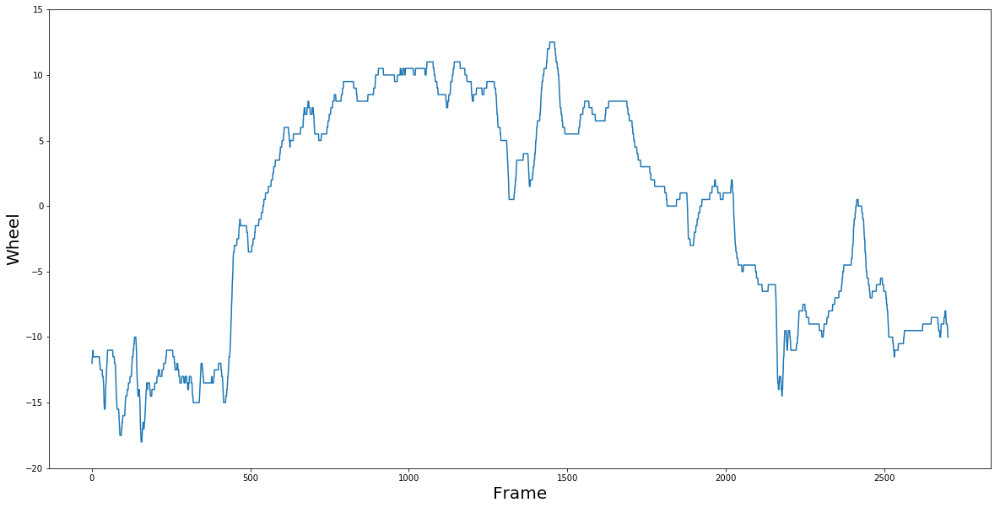

In [46]:
plt.figure(figsize=(20, 10))

x = np.linspace(1, 2701, 2700)
plt.plot(x, csv_4)
plt.ylim(-20, 15)
plt.ylabel('Wheel',fontsize=20)
plt.xlabel('Frame',fontsize=20)
plt.savefig('epoch4.png')
# plt.legend('ABCDEF', ncol=2, loc='upper left');


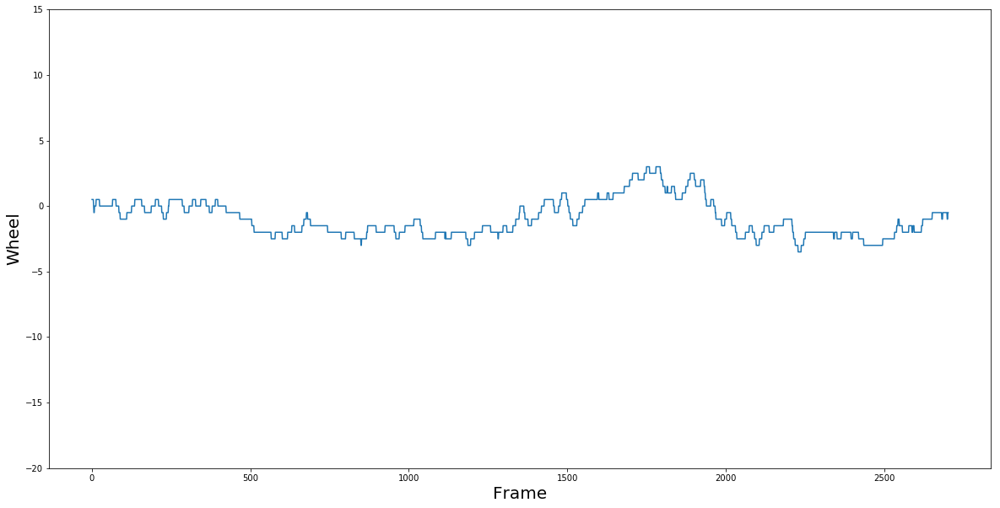

In [45]:
plt.figure(figsize=(20, 10))

x = np.linspace(1, 2701, 2700)
plt.plot(x, csv_9)
plt.ylim(-20, 15)
plt.ylabel('Wheel',fontsize=20)
plt.xlabel('Frame',fontsize=20)
# plt.legend('ABCDEF', ncol=2, loc='upper left');
plt.savefig('epoch9.png')

## 准备test set without shuffle

test set 不太需要shuffle，找到error_idx对应的imgaes，输出（下次shuffle前，记住idx）。
重新process 10 epoch，输出images


In [6]:
import sys
import os
import time
import cv2
import numpy as np
import utils
import params 
import imageio
from utils import without_ext,ext,mkv_to_mp4
import h5py

In [3]:
## Preprocess
def img_pre_process(img, YUV=True):
    """
    Processes the image and returns it
    :param img: The image to be processed
    :YUV=Ture, turn RGB to YUV, else keep RGB
    :return: Returns the processed image(crop, resize, YUV, normalization)
    """
    # Chop off 1/3 from the top and cut bottom 150px(which contains the head of car) img[240:570,:,:]
    shape = img.shape
    img_crop = img[int(shape[0]/3):shape[0]-150, 0:shape[1]]
    
    # Resize the image
    img_resize = cv2.resize(img_crop, (200, 66), interpolation=cv2.INTER_AREA)
    
    if YUV:
        # RGB to YUV
        img_yuv = cv2.cvtColor(img_resize, cv2.COLOR_BGR2YUV)

        # Normalize, need int???
        img_nor = img_yuv/255.0
    else:
        img_nor = img_resize/255.0
    assert img_nor.shape == (66,200,3)
    assert img_nor.min() >= 0
    assert img_nor.max() <= 1
    
    return img_nor

In [4]:
def process_epoch_data(epoch_id, YUV=True, write=True):
    print('---------- processing video for epoch {} ----------'.format(epoch_id))
    vid_mkv_path = utils.join_dir(params.data_dir, 'epoch{:0>2}_front.mkv'.format(epoch_id))
    
    # convert mkv to mp4
    vid_mp4_path = utils.join_dir(params.data_dir, 'epoch{:0>2}_front.mp4'.format(epoch_id))
    if not os.path.exists(vid_mp4_path):
        mkv_to_mp4(vid_mkv_path, remove_mkv=False)    
    
    # slice mp4 to images
    vid = imageio.get_reader(vid_mp4_path,'ffmpeg')
    images = []
    for num in range(len(vid)):
        image = vid.get_data(num)
        images.append(image)
        if write:
            imageio.imwrite('./images_10epoch/epoch{:0>2}_{}_front.jpg'.format(epoch_id,num), image)

    print('epoch{:0>2}_front.mkv has {} images'.format(epoch_id,len(images)))
    
    # processing crop, resize, yuv, normalization
    images_process =  [img_pre_process(img, YUV) for img in images]
    images_epoch = np.stack(images_process, axis=0)
                       
    return images_epoch 

In [8]:
images_test = process_epoch_data(10)
images_test.shape

---------- processing video for epoch 10 ----------
epoch10_front.mkv has 2700 images


(2700, 66, 200, 3)

In [18]:
import csv
# import numpy as np

def process_epoch_csv(epoch_id):
    print('---------- processing csv file for epoch {} ----------'.format(epoch_id))
    csv_path = utils.join_dir(params.data_dir, 'epoch{:0>2}_steering.csv'.format(epoch_id))
    with open(csv_path,'r') as f:
        data_iter = csv.reader(f, delimiter = ",")
        next(data_iter, None)  # skip the headers
        data = [line[-1] for line in data_iter]
    data_array = np.asarray(data, dtype = np.float32)   
    return data_array



In [11]:
csv_test = process_epoch_csv(10).reshape(-1,1)
csv_test.shape

---------- processing csv file for epoch 10 ----------


(2700, 1)

In [12]:

%time h5f = h5py.File('./data/test_no_shuffle.h5', 'w')
%time h5f.create_dataset('image', data=images_test)
%time h5f.create_dataset('steering', data=csv_test)
h5f.close()

CPU times: user 2.38 ms, sys: 25.7 ms, total: 28.1 ms
Wall time: 84.2 ms
CPU times: user 9.29 ms, sys: 1.9 s, total: 1.9 s
Wall time: 3.89 s
CPU times: user 409 µs, sys: 29 µs, total: 438 µs
Wall time: 442 µs
